# Introduction to machine learning

CSI 4106 - Fall 2026

Marcel Turcotte  
Version: Sep 15, 2026 11:59

# Preamble

## Message of the day (1/2)

![](https://media.wired.com/photos/6aa1afc94eb21a2db77402a8/1:1/w_2240,c_limit/Security_InterviewWithAnthropicGuyWhoQuitBecauseAI_v-ezgif.com-video-to-gif-converter.gif)

[The AI Researcher Who Just Quit Anthropic Says It’s ‘Crunch Time for
Humanity’](https://www.wired.com/story/anthropic-researcher-quits-jacob-coxon-ai-fears-humanity).
Wired. 2026-09-09.

## Message of the day (2/2)

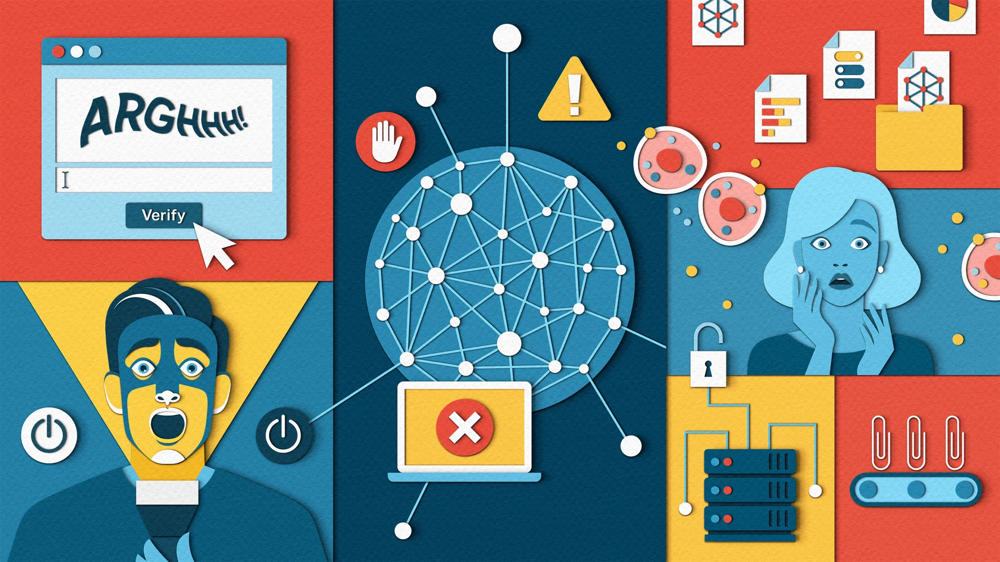

[Why Do We Tell Ourselves Scary Stories About
AI?](https://www.quantamagazine.org/why-do-we-tell-ourselves-scary-stories-about-ai-20260410).
Quanta Magazine, 2026-04-10.

## From the Previous Lecture

- **Symbolic** and **connectionist** methods are two major traditions in
  AI.
- Defining **intelligence** remains challenging.
- Russell and Norvig describe **four perspectives on AI**: thinking
  humanly, acting humanly, thinking rationally, and acting rationally.
- **Narrow AI** targets particular tasks; **artificial general
  intelligence** is a broader and contested goal.
- Difficult, unresolved questions frequently concern **embodiment**,
  **agency**, **sentience**, **consciousness**, **emotion**, and
  **cognition**.

## Learning objectives

- **Distinguish** supervised, unsupervised, and reinforcement learning
  by the feedback available
- **Identify** examples, features, and targets in a supervised-learning
  dataset
- **Differentiate** classification from regression, and learning from
  inference
- **Apply** the basic scikit-learn workflow: load data, explore it, fit
  a model, and make predictions
- **Explain** why a separate test set is needed to estimate performance
  on unseen data

**Reading:** Russell and Norvig (2020), Chapter 19, “Learning from
Examples.”

# Introduction

## Rationale

**Why should** a computer program *learn*?

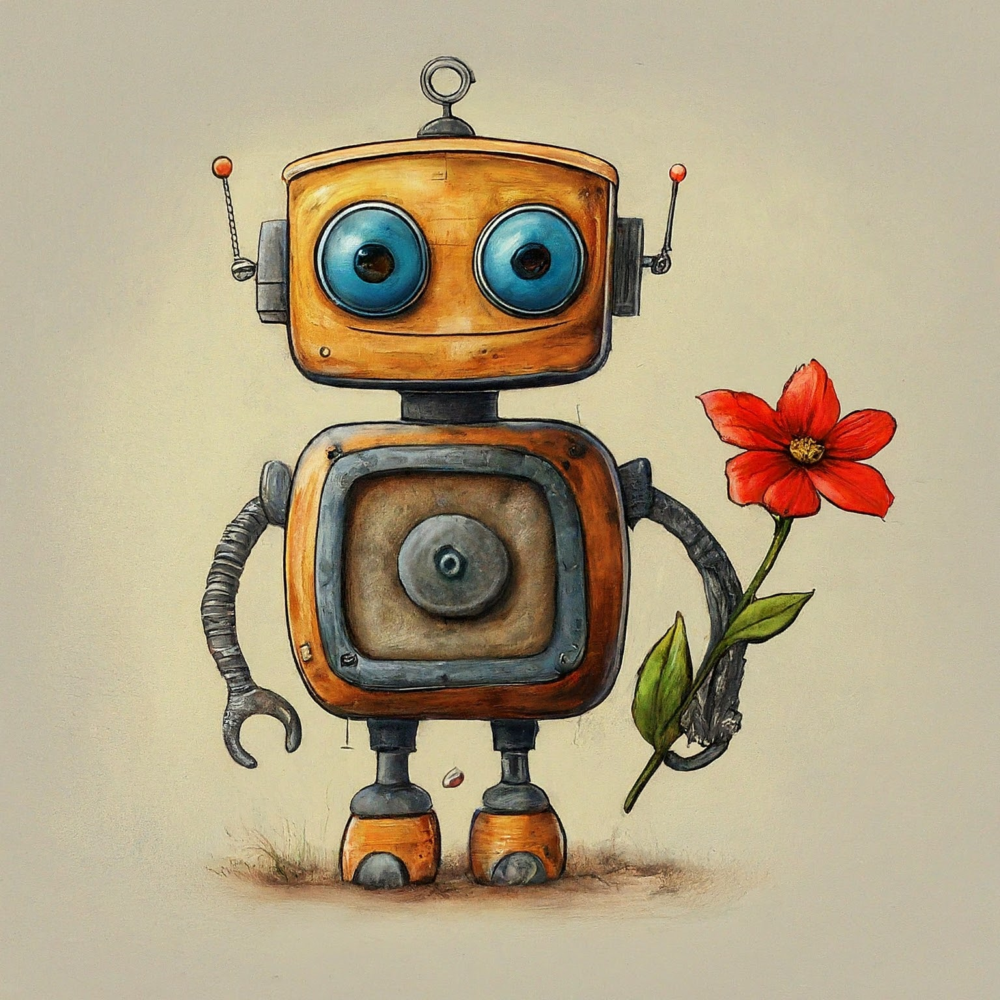

**Attribution**: Gemini 1.5 Flash, Aug. 14, 2024, prompted with “In the
style of a children’s book, create the image of a cute robot holding a
red flower.”

1.  **Adaptability and Continuous Improvement:**
    - **Adaptability to Dynamic Environments:** Programs that learn can
      adapt to changing conditions, remaining effective in dynamic
      settings.
      - *Example:* Self-driving cars adjusting to traffic and weather
        changes.
    - **Continuous Improvement:** Learning enables systems to stay
      current with new data and trends without constant human
      intervention.
      - *Example:* Spam filters evolving to counter new spam techniques.
2.  **Enhanced Performance and Efficiency:**
    - **Improved Performance:** Learning allows programs to improve
      their performance based on past experience or data.
      - *Example:* Recommendation systems refining suggestions with more
        user data.
    - **Cost-Effectiveness:** Automating the learning process reduces
      the need for manual updates, leading to cost savings.
      - *Example:* Predictive maintenance systems minimizing manual
        inspections.
3.  **Complex Problem Solving and Hidden Pattern Discovery:**
    - **Handling Complex Problems:** Learning algorithms tackle problems
      that are too intricate for static, rule-based systems.
      - *Example:* Image recognition distinguishing between different
        objects.
    - **Discovering Hidden Patterns:** Learning models can uncover
      relationships in data that are not evident to human analysts.
      - *Example:* Identifying complex genomic relationships in
        bioinformatics.
4.  **Personalization and Scalability:**
    - **Personalization:** Learning allows programs to provide tailored
      outputs to individual users, enhancing the user experience.
      - *Example:* Virtual assistants learning user preferences.
    - **Scalability:** Learning algorithms efficiently manage and
      analyze large datasets, improving their utility.
      - *Example:* Search engines optimizing result relevance with
        machine learning.
5.  **Innovation and Research:**
    - **Fostering Innovation:** Learning algorithms can simulate new
      ideas, leading to advancements and discoveries.
      - *Example:* Machine learning models predicting drug efficacy in
        pharmaceutical research.

## Definition

>  **Mitchell (1997), page 2**
>
> A computer program is said to **learn** from **experience $E$** with
> respect to some class of **tasks $T$** and **performance measure
> $P$**, if its performance at tasks in $T$, as measured by $P$,
> improves with experience $E$.

Tom M Mitchell. [Machine
Learning](https://www.cs.cmu.edu/~tom/mlbook.html). McGraw-Hill, New
York, 1997.
([PDF](http://www.cs.cmu.edu/~tom/files/MachineLearningTomMitchell.pdf))

Although this book was published in 1997, it has been influential and
remains relevant. Unlike many other machine learning books, it is
particularly engaging.

This particular definition of learning is often reused.

## Concepts



See: [ml_concepts-00.svg](../../assets/images/ml_concepts-00.svg)

## Types of problems

We will begin with three broad learning settings, distinguished by the
**feedback** available:

1.  **Unsupervised learning:** The examples have no target labels.
2.  **Supervised learning:** Each training example is accompanied by a
    target label.
3.  **Reinforcement learning:** An agent receives numerical rewards
    while interacting with an environment.

. . .

**Supervised learning** is the most extensively studied and arguably the
most intuitive type of learning. It is typically the first type of
learning introduced in educational contexts.

## Unsupervised Learning

**Given:** feature vectors $x_1, x_2, \ldots, x_N$, but **no target
labels** $y_i$.

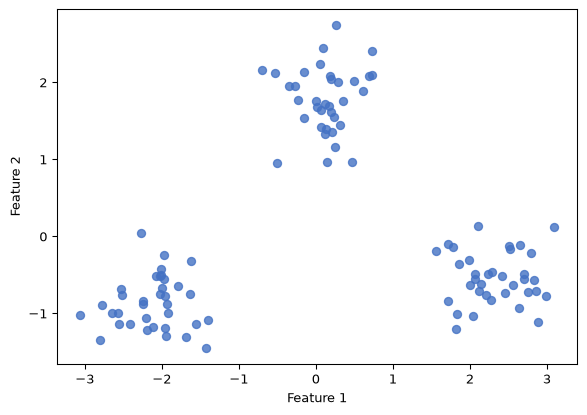

In [2]:
import matplotlib.pyplot as plt
import numpy as np

rng = np.random.default_rng(7)
centres = [(-2.0, -0.8), (0.2, 1.8), (2.3, -0.5)]
points = np.vstack([
    rng.normal(loc=centre, scale=0.42, size=(35, 2))
    for centre in centres
])

plt.scatter(points[:, 0], points[:, 1], color="#4472C4", alpha=0.8)
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.gca().set_aspect("equal", adjustable="box")
plt.show()

Finding **structure** without labels

Every point has the same colour because no class labels were supplied. A
clustering algorithm attempts to infer groups from the feature values.

In **unsupervised learning**, an algorithm receives examples without
target labels and attempts to discover useful structure in them.

**Clustering** groups examples that are similar according to the
selected features and distance measure. The groups are inferred rather
than supplied by a teacher. They should not automatically be interpreted
as objectively correct or meaningful categories: the result can change
with the features, scaling, algorithm, and its settings.

Other unsupervised-learning tasks include:

- **dimensionality reduction**, which represents data using fewer
  variables while preserving useful structure;
- **density estimation**, which models where observations tend to occur;
  and
- **anomaly detection**, which identifies observations that differ
  markedly from the usual patterns.

This course will not develop these methods further; the objective here
is to recognize the paradigm and distinguish it from supervised
learning.

## Reinforcement Learning

An **agent** takes actions in an **environment**, observes the
consequences, and receives numerical **rewards**.

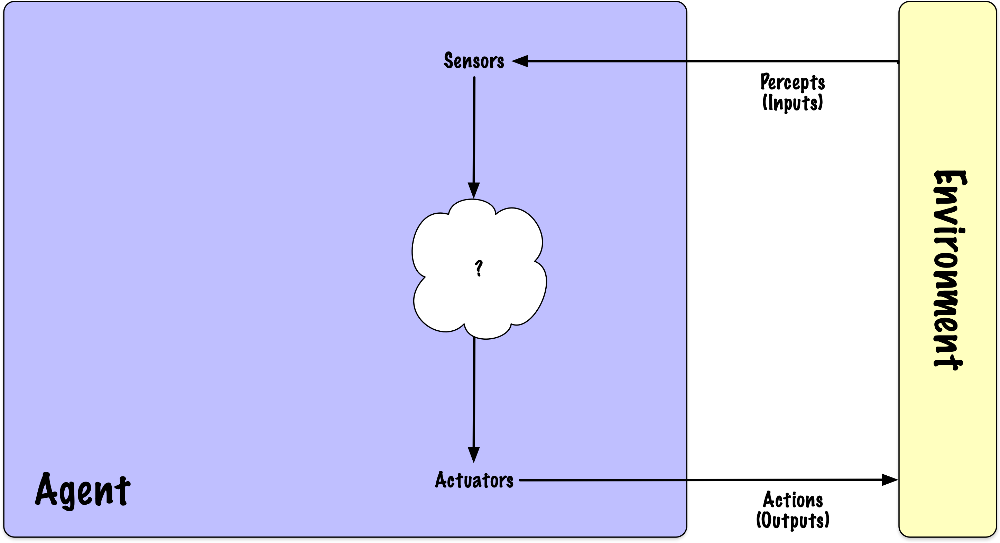

**Goal:** Learn a **policy** for choosing actions that **maximizes
cumulative reward**.

In **reinforcement learning**, an agent learns through repeated
interaction with an environment. At each step, it receives an
observation, chooses an action, and receives a numerical reward together
with the next observation.

The reward evaluates the consequences of behaviour, but it is not a
target label specifying the correct action. Rewards may also be delayed:
an action can affect outcomes many steps later. The agent must therefore
learn a **policy**—a strategy for choosing actions—that performs well
over time rather than merely maximizing the immediate reward.

Typical applications include games, robotics, resource allocation, and
control systems. A central difficulty is balancing **exploration** of
unfamiliar actions with **exploitation** of actions that have worked
well so far.

This course will not develop reinforcement-learning algorithms further;
students should be able to identify the agent, environment, actions,
observations, rewards, and overall objective.

## Supervised Learning: Two Phases

For the supervised-learning workflow studied in this course:

1.  **Learning** (building a model)
2.  **Inference** (using the model)

Separating learning from inference is a useful description of the batch
supervised-learning workflow used in this course. It is not universal:
in reinforcement learning, for example, acting, receiving feedback, and
updating the policy may be interleaved.

## Learning: Building a Model

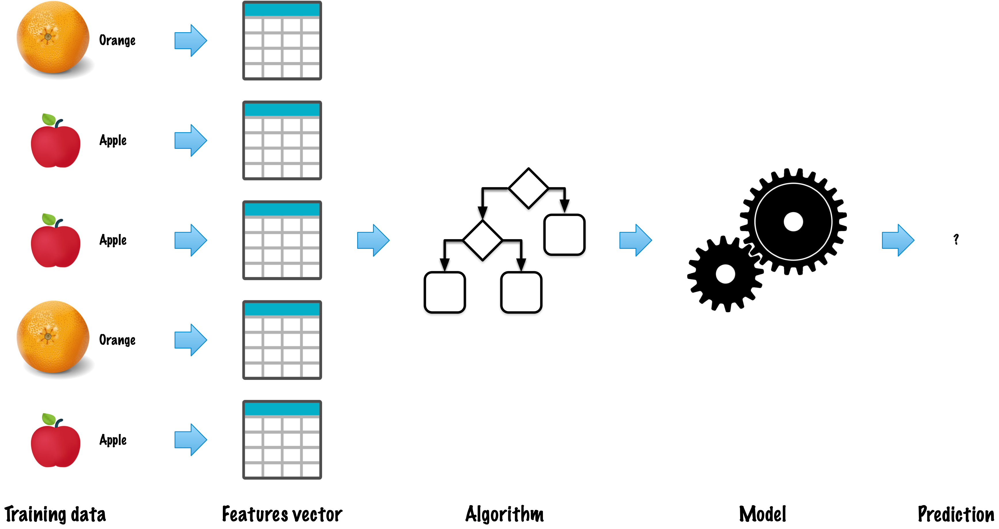

In machine learning, the learning phase is often the most challenging
and resource-intensive component. This stage necessitates meticulous
attention to data curation, as well as the selection and training of an
appropriate algorithm.

Training some contemporary frontier models is estimated to cost more
than US\$100 million.

![](https://hai.stanford.edu/assets/images/inline-images/AIIndex_2024_StateofAI_BLOG_04.jpg)

**Source:** [Stanford University Human-Centered Artificial Intelligence
2025 AI Index
Report](https://hai.stanford.edu/news/ai-index-state-ai-13-charts)

Developing such models necessitates infrastructure investments that
could reach trillions of dollars.

- “By the end of 2024, we’re aiming to continue to grow our
  infrastructure build-out that will include **350,000 NVIDIA H100
  GPUs** as part of **a portfolio that will feature compute power
  equivalent to nearly 600,000 H100s**.”
  - [Building Meta’s GenAI
    Infrastructure](https://engineering.fb.com/2024/03/12/data-center-engineering/building-metas-genai-infrastructure/),
    2024-03-12.
- [OpenAI’s Sam Altman Expects to Spend ‘Trillions’ on
  Infrastructure](https://www.bloomberg.com/news/articles/2025-08-15/openai-s-altman-expects-to-spend-trillions-on-infrastructure),
  Bloomberg, 2025-08-15.

## Inference: Using a Model

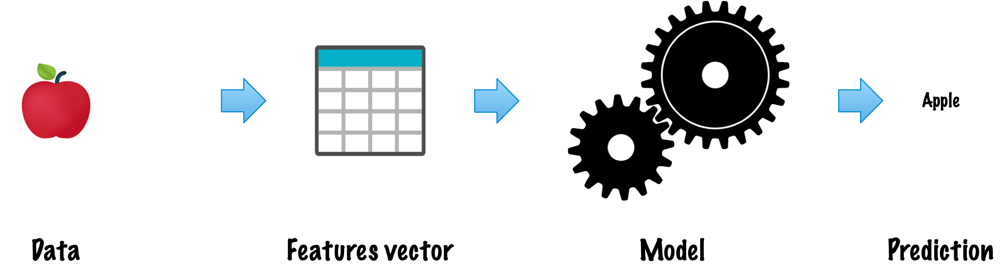

Inference for one example typically demands fewer computational
resources than training a model. However, the total cost can still be
substantial when a model serves many users, and some reasoning systems
deliberately use more computation at inference time.

- [OpenAI’s o3 Reasoning Models Are Extremely Expensive to
  Run](https://observer.com/2025/04/openai-o3-model-cost/), Alexandra
  Tremayne-Pengelly, *Observer*, 2025-04-04. Media cost estimates depend
  strongly on the inference configuration and should not be interpreted
  as a stable price per query.

# Carp-e Diem! (example)

## 1. Problem: Will They Bite Today?

**Objective:** Develop a predictive model that classifies a fishing day
as **Poor**, **Average**, or **Excellent**.

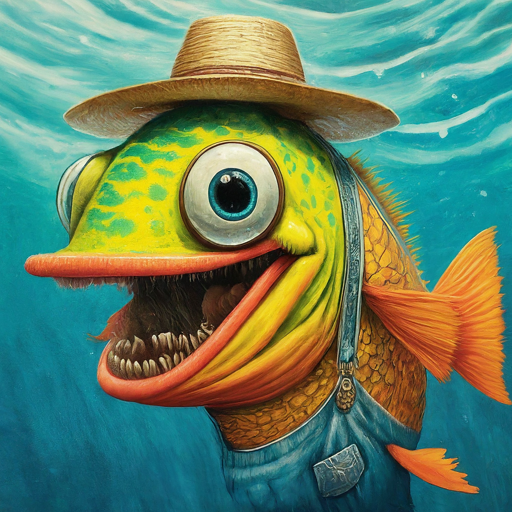

**Attribution**: Gemini 1.5 Flash, Sept. 10, 2024, prompted with “In the
style of a children’s book, generate the image of a fish with a farmer’s
hat.”

Supervised learning involves training a model on labelled data so that
it can **make predictions on new, unseen data**.

The specific task is **classification**.

“Poor”, “Average”, and “Excellent” are **classes** (for the target
variable).

## 2. Attributes (features)

Fishing traditions and guides, including [**The Old Farmer’s
Almanac**](https://www.almanac.com/best-fishing-days), often use the
**moon phase** when recommending fishing days. We will treat it as a
candidate feature; whether it is genuinely predictive is an empirical
question.

- **Moon Phase (Categorical)**: ‘New Moon’, ‘First Quarter’, ‘Full
  Moon’, and ‘Last Quarter’.
- **Forecast (Categorical)**: ‘Rainy’, ‘Cloudy’, and ‘Sunny’.
- **Outdoor Temperature (Numerical):** The air temperature in degrees
  Celsius.
- **Water Temperature (Numerical):** The water temperature of the lake
  or river.

Obviously, real-world applications will have many more attributes.

## 3. Training data

| Example | Moon Phase | Forecast | Outdoor Temperature (°C) | Water Temperature (°C) | Fishing Outcome |
|-------|-----------|--------|-----------------|----------------|----------------|
| 1 | Full Moon | Sunny | 25 | 22 | Excellent |
| 2 | New Moon | Cloudy | 18 | 19 | Average |
| 3 | First Quarter | Rainy | 15 | 17 | Poor |
| 4 | Last Quarter | Sunny | 30 | 24 | Excellent |
| 5 | Full Moon | Cloudy | 20 | 20 | Average |
| 6 | New Moon | Rainy | 22 | 21 | Poor |

This is a **supervised-learning** problem because the target is known
for each training example. Since the possible targets are categories, it
is a **classification task**.

This small dataset is invented for illustration. It contains only six
examples; a real study would require substantially more representative
observations and a carefully defined outcome.

The choice of attributes and the quality of the data are crucial to
model performance. An attribute such as the colour of your socks is
unlikely to have much effect on the predictions.

Therefore, a machine learning project typically begins with an
exploratory phase, which involves analyzing the data, examining
distributions, and identifying correlations.

## 3. Training data: data representation

| Moon Phase    | Forecast | Outdoor Temperature (°C) | Water Temperature (°C) |
|---------------|----------|--------------------------|------------------------|
| Full Moon     | Sunny    | 25                       | 22                     |
| New Moon      | Cloudy   | 18                       | 19                     |
| First Quarter | Rainy    | 15                       | 17                     |
| Last Quarter  | Sunny    | 30                       | 24                     |
| Full Moon     | Cloudy   | 20                       | 20                     |
| New Moon      | Rainy    | 22                       | 21                     |

The **data** is often presented in a tabular (matrix) format, where each
row represents an **attribute vector** (feature vector), typically
denoted as $x_i$, which corresponds to the $i$-th example in the
training set.

## 3. Training data: label representation

| Fishing Outcome |
|-----------------|
| Excellent       |
| Average         |
| Poor            |
| Excellent       |
| Average         |
| Poor            |

The **labels** are generally represented as a column vector, with $y_i$
denoting the label for the $i$-th example.

## 4. Model Training

**Model training** uses labelled examples to construct a model that can
make predictions. Depending on the algorithm, training may **estimate
parameters**, **build a structure**, or simply **store examples**.

## 4. Model Training (continued)

A simple model that fits all six training examples is:

- If the forecast is **Sunny**, predict **Excellent**.
- If the forecast is **Cloudy**, predict **Average**.
- If the forecast is **Rainy**, predict **Poor**.

Fitting six examples does not establish that the model will predict new
fishing days accurately.

## 5. Prediction

Given new, **unseen data**, predict today’s fishing category.

. . .

- Moon Phase: **New Moon**
- Forecast: **Sunny**
- Outdoor Temperature: **24°C**
- Water Temperature: **21°C**

. . .

**Prediction:** Excellent

## Life cycle

1.  Data collection and preparation
2.  Feature engineering
3.  Training
4.  Model evaluation
5.  Model deployment
6.  Monitoring and maintenance

- **Data collection** and **preparation** are critical and
  labor-intensive processes.
  - There must be **sufficient** data.
  - The data must be of high **quality**; for instance, it should not be
    excessively noisy.
  - There should be few **missing values**.
  - Most importantly, the data should be **representative**. We expect
    that new data will be generated from the same process and have the
    same distribution.
    - The importance of this cannot be overstated.
      - Consider image classification software that was not trained on a
        diverse sample in terms of ethnicity, gender, body size, or
        social status.
      - Think of medical applications and the consequences of datasets
        that are not sufficiently diverse.
- **Feature engineering** is the process of selecting, transforming, and
  creating input variables (features) that make useful patterns easier
  for a model to learn. It can include scaling numerical variables,
  representing categorical variables, and constructing new features.
  - Deep learning can learn useful representations directly from data,
    but data preparation and feature choices remain important.
- **Model evaluation** is the process of assessing a machine learning
  model’s performance using specific metrics, such as accuracy,
  precision, recall, F1-score, or AUC-ROC. This typically involves
  testing the model on a separate validation or test dataset to ensure
  it generalizes well to unseen data and meets the desired criteria for
  accuracy and reliability.
- **Model deployment**: The trained model is integrated into an
  application. Many deployed models have fixed parameters and are
  updated periodically; others learn continuously from new data. The
  appropriate strategy depends on cost, risk, and how quickly the
  data-generating process changes.
- **Monitoring and maintenance**: The performance of the model needs to
  be continuously monitored. **Concept drift** is often observed,
  requiring the system to be retrained. Spam detection is a good
  example. Once the system is deployed, spammers adapt and find ways to
  circumvent the spam detection mechanisms put in place.

# Formal definitions

## Supervised learning (notation)

The **dataset** (“experience”) is a collection of labelled examples.

- $\{(x_i, y_i)\}_{i=1}^N$
  - Each $x_i$ is a **feature** (**attribute**) vector with $D$
    dimensions.
  - $x_i^{(j)}$ is the value of feature $j$ for example $i$, where
    $j \in \{1, \ldots, D\}$ and $i \in \{1, \ldots, N\}$.
  - The **target** $y_i$ may be a **class** from a finite set
    $\{1, 2, \ldots, C\}$, a **real number**, or a **structured object**
    such as a sequence, tree, or graph.

. . .

**Problem:** Given the dataset, create a **model** that can predict the
value of $y$ for an unseen $x$.

This notation follows that of [**The Hundred-Page Machine Learning
Book**](https://themlbook.com) by Andriy Burkov.

## Supervised learning (notation, continued)

- When the **target** $y_i$ is a **class**, taken from a finite list of
  classes, $\{1, 2, \ldots, C\}$, we call the task a **classification**
  task.

- When the **target** $y_i$ is a **real number**, we call the task a
  **regression** task.

Anil Ananthaswamy, in his book [Why Machines Learn: The Elegant Math
Behind Modern
AI](https://www.penguinrandomhouse.com/books/677608/why-machines-learn-by-anil-ananthaswamy/),
offers an example inspired by the COVID-19 pandemic.

In this advanced scenario, hospitals globally are systematically
compiling patient data from the early stages of the COVID-19 pandemic.
Each patient is characterized by six key variables: $x_1$ representing
age, $x_2$ indicating body mass index, $x_3$ denoting difficulty
breathing (encoded as 1 for yes and 0 for no), $x_4$ signifying the
presence of fever (yes/no), $x_5$ for diabetes status (yes/no), and
$x_6$ describing chest CT scan results (0 for clear, 1 for mild
infection, 2 for severe infection). These variables collectively form a
six-dimensional vector for each patient.

Clinicians have observed that patients typically follow one of two
trajectories: they either stabilize and are discharged approximately
three days after admission, or their condition deteriorates,
necessitating ventilator support. Consequently, each patient is assigned
an outcome variable, $y$, where $y = -1$ indicates no need for
ventilator support after three days, and $y = 1$ indicates the
requirement for ventilator support after three days.

Can you think of examples of regression tasks? The defining feature is
that the target is a numerical quantity. Examples include:

- estimating the selling price of a house;
- forecasting tomorrow’s temperature or electricity demand;
- estimating travel time or remaining battery life;
- predicting medical costs; and
- estimating the amount a customer will spend.

Some problems can be formulated in more than one way. Predicting whether
a borrower will default is classification; predicting the probability of
default produces a numerical score.

# Example with code

## `Scikit-learn`

>  **[scikit-learn.org](https://scikit-learn.org)**
>
> `scikit-learn` is an open-source machine learning library that
> supports **supervised** and **unsupervised** learning. It also
> provides tools for **model fitting**, **data preprocessing**, **model
> selection**, **model evaluation**, and many other tasks.
>
> `scikit-learn` provides **dozens of built-in machine learning
> algorithms and models**, called estimators.
>
> Built on [NumPy](https://numpy.org), [SciPy](https://scipy.org), and
> [matplotlib](https://matplotlib.org).

We will use `scikit-learn` for this example and throughout the coming
weeks.

## `Scikit-learn`

![](https://scikit-learn.org/stable/_downloads/b82bf6cd7438a351f19fac60fbc0d927/ml_map.svg)

**Attribution:** [Choosing the right
estimator](https://scikit-learn.org/stable/machine_learning_map.html)

## Example: Palmer Penguins Dataset

![](https://allisonhorst.github.io/palmerpenguins/reference/figures/lter_penguins.png "Artwork by @allison_horst")

The [Palmer penguins
dataset](https://allisonhorst.github.io/palmerpenguins/) by Allison
Horst, Alison Hill, and Kristen Gorman. **Artwork** by @allison_horst

> The [Palmer penguins
> dataset](https://allisonhorst.github.io/palmerpenguins/) by Allison
> Horst, Alison Hill, and Kristen Gorman was first made publicly
> available as an [R
> package](https://cran.r-project.org/web/packages/palmerpenguins/index.html).
> The goal of the Palmer Penguins dataset is to replace the highly
> overused Iris dataset for data exploration & visualization.

> Using this Python package you can easily load the Palmer penguins into
> your Python environment.

Initially, we will examine the entire example from a high-level
perspective to provide a clear overview of the steps involved.
Subsequently, we will revisit this example in greater detail.

## Example: In Case of a Missing Library

In [3]:
try:
    from palmerpenguins import load_penguins
except ModuleNotFoundError:
    %pip install -q palmerpenguins
    from palmerpenguins import load_penguins

If you are executing this Jupyter Notebook within Google Colab or any
environment where the library is not pre-installed, proceed with the
installation.

## Example: Loading the Data

In [4]:
# It is customary to use X and y for the data and labels

X, y = load_penguins(return_X_y = True)

# Remove rows with missing measurements

X = X.dropna()
y = y.loc[X.index]

Two penguins have missing measurements. For this first example, we
remove those rows before training.

## Example: Using a Decision Tree

In [5]:
from sklearn import tree

clf = tree.DecisionTreeClassifier(criterion="entropy", random_state=42)

Available classifiers include **decision trees**, **support vector
machines**, **k-nearest neighbours**, **logistic regression**, and
**neural networks**.

## Example: Training

In [6]:
# Training

clf = clf.fit(X, y)

scikit-learn estimators share a consistent interface. Classifiers expose
methods such as `fit`, `predict`, and `score`.

The `DecisionTreeClassifier` in scikit-learn constructs a decision tree
by recursively splitting the dataset. With `criterion="entropy"`, it
selects thresholds that produce the greatest reduction in weighted
entropy. Here is a concise description of the process:

1.  **Initialization**: The algorithm starts with the entire dataset as
    the root node.

2.  **Splitting criterion**: At each node, it evaluates candidate
    thresholds across the available numerical features and retains the
    split that best separates the classes.

3.  **Recursive Splitting**: The dataset is divided into subsets based
    on the selected attribute and threshold, creating child nodes. This
    process is repeated recursively for each child node.

4.  **Stopping conditions**: Splitting stops when a stopping rule is
    reached—for example, when a node is pure, no candidate split
    improves the objective, or a depth or sample-size limit applies.

5.  **Terminal Nodes**: Once splitting is complete, each terminal node
    is assigned a class label based on the majority class of the samples
    in that node.

The resulting tree can then be used to classify new samples by
traversing from the root to a terminal node, following the decision
rules defined at each node.

## Example: Visualizing the tree (1/2)

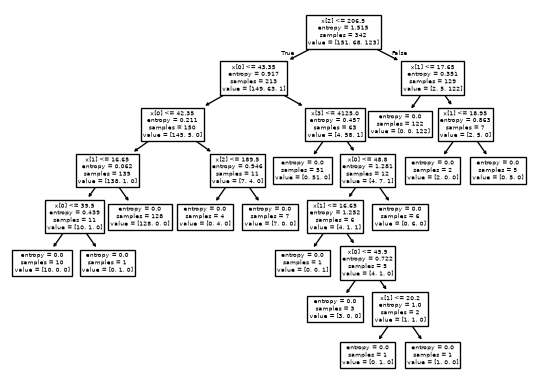

In [7]:
import matplotlib.pyplot as plt

tree.plot_tree(clf)
plt.show()

## Example: Visualizing the tree (2/2)

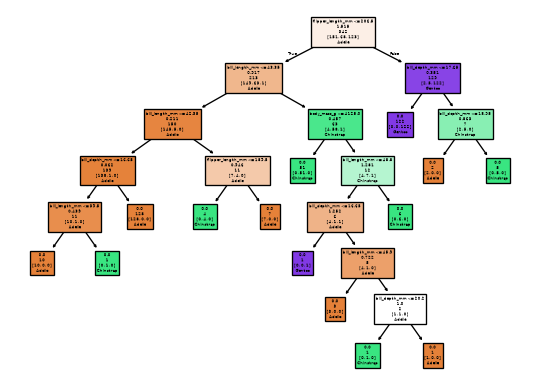

In [8]:
target_names = clf.classes_

tree.plot_tree(clf, 
               feature_names = X.columns,
               class_names = target_names,
               label = 'none',
               filled = True)
plt.show()

## Example: Prediction

In [9]:
import pandas as pd

# Create two new examples

column_names = ['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g']
new_penguins = pd.DataFrame(
    [[34.2, 17.9, 186.8, 2945.0], [51.0, 15.2, 223.7, 5560.0]],
    columns=column_names,
)

# Prediction

predictions = clf.predict(new_penguins)

# Printing the predicted labels for our two examples

print(predictions)

['Adelie' 'Gentoo']

## Example: Complete

['Adelie' 'Gentoo']

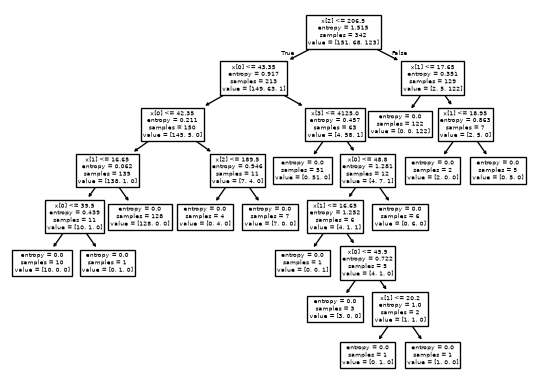

In [10]:
X, y = load_penguins(return_X_y = True)
X = X.dropna()
y = y.loc[X.index]
clf = tree.DecisionTreeClassifier(criterion="entropy", random_state=42)
clf = clf.fit(X, y)
tree.plot_tree(clf)
new_penguins = pd.DataFrame(
    [[34.2, 17.9, 186.8, 2945.0], [51.0, 15.2, 223.7, 5560.0]],
    columns=column_names,
)
print(clf.predict(new_penguins))

## Example: Apparent Performance

In [11]:
from sklearn.metrics import classification_report, accuracy_score

# Make predictions

y_pred = clf.predict(X)

# Evaluate the model

accuracy = accuracy_score(y, y_pred)
report = classification_report(y, y_pred, labels=clf.classes_, target_names=clf.classes_)

print(f'Accuracy: {accuracy:.2f}')
print('Classification Report:')
print(report)

Accuracy: 1.00
Classification Report:
              precision    recall  f1-score   support

      Adelie       1.00      1.00      1.00       151
   Chinstrap       1.00      1.00      1.00        68
      Gentoo       1.00      1.00      1.00       123

    accuracy                           1.00       342
   macro avg       1.00      1.00      1.00       342
weighted avg       1.00      1.00      1.00       342


## Example: Discussion

We have demonstrated a complete example:

- Loading the data
- Selecting a classifier
- Training the model
- Visualizing the model
- Making a prediction

However, several simplifications were made throughout this process.

## Example: Wait a Minute!

In [12]:
from sklearn.metrics import classification_report, accuracy_score

# Make predictions

y_pred = clf.predict(X)

# Evaluate the model

accuracy = accuracy_score(y, y_pred)
report = classification_report(y, y_pred, labels=clf.classes_, target_names=clf.classes_)

print(f'Accuracy: {accuracy:.2f}')
print('Classification Report:')
print(report)

> **Important**
>
> This example is misleading, or even flawed!

The performance of this classifier appears to be perfect at first
glance. However, is it really?

These predictions are made on the same examples used for training. This
is **training accuracy**, not an estimate of performance on unseen data.

## Example: Exploration

In [13]:
penguins = load_penguins()

. . .

In [14]:
type(penguins)

pandas.DataFrame

. . .

In [15]:
penguins.head()

## Example: Exploration

In [16]:
penguins.describe()

## Example: Using `Seaborn`

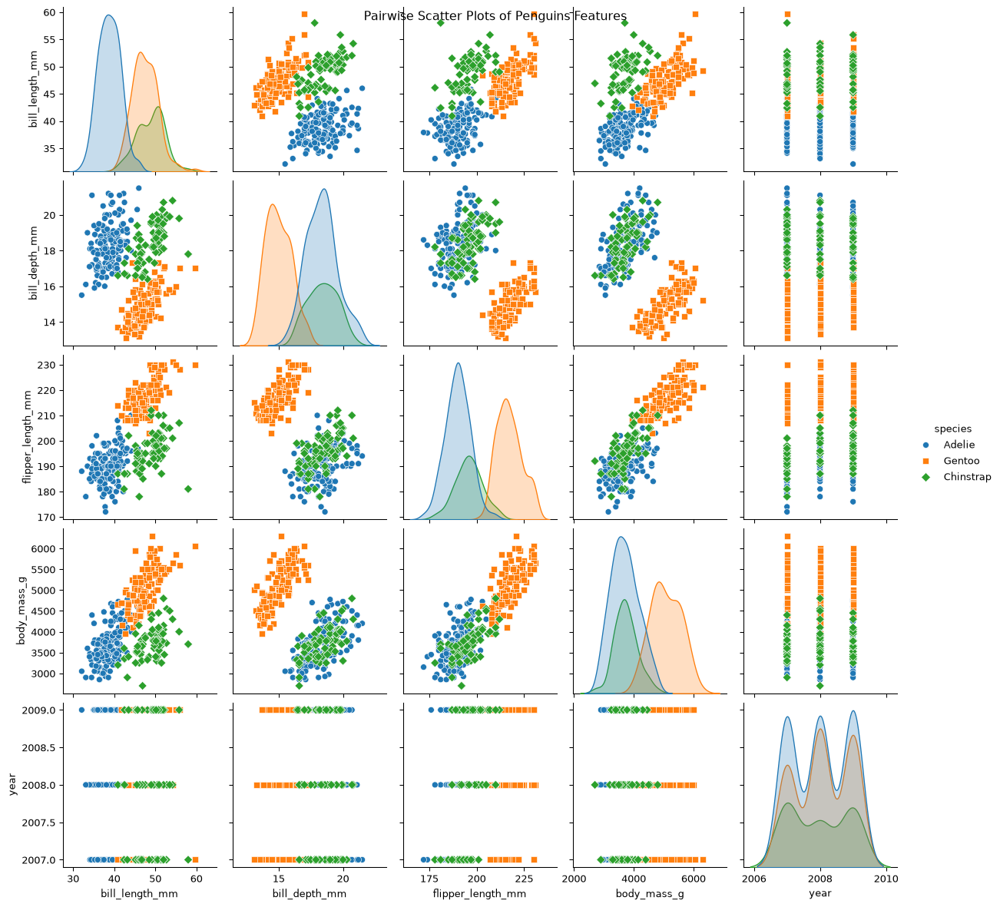

In [17]:
import seaborn as sns

# Pairplot using seaborn

sns.pairplot(penguins, hue='species', markers=["o", "s", "D"])
plt.suptitle("Pairwise Scatter Plots of Penguins Features")
plt.show()

What insights can be drawn from examining the graphs?

The figure presents pairwise plots of the Palmer Penguins features, with
the diagonal showing the distribution of each individual feature. Each
dot represents an example ($x$), and the colours indicate its label
($y$).

Let’s first consider the diagonal elements:

- Is it possible to classify the examples using a single feature?
- We observe that each feature alone cannot distinguish between the
  classes.
- However, plots involving **bill depth**, **body mass**, or **flipper
  length** help distinguish **Gentoo** from the other two species,
  although **Adélie** and **Chinstrap** still overlap.

The class **Gentoo** frequently forms a distinct cluster.

## Example: Training and Test Set

In [18]:
from sklearn.model_selection import train_test_split

# Split the dataset into training and testing sets

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=7,
    stratify=y,
)

Our initial decision tree was constructed and evaluated using the entire
dataset. It can fit those examples closely, but this does not tell us
how accurately it will predict **unseen data**.

We will have a lot more to say about testing in the coming weeks.

For narrative clarity, these slides explored the full dataset before
introducing the split. In a rigorous experiment, the test set should be
set aside before making data-driven modelling choices and left untouched
until final evaluation.

`random_state` makes the pseudo-random partition reproducible. Changing
it changes which examples are held out and may change the measured
accuracy. `stratify=y` keeps the class proportions approximately
consistent across the two subsets.

**Practice:** Experiment with different values for `random_state`. What
do you observe, and why?

## Example: Creating a New Classifier

In [19]:
clf = tree.DecisionTreeClassifier(criterion="entropy", random_state=42)

## Example: Training the New Classifier

In [20]:
clf.fit(X_train, y_train)

## Example: Visualizing the Tree

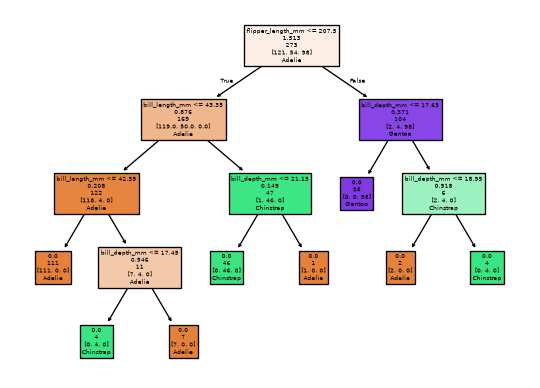

In [21]:
tree.plot_tree(clf, 
               feature_names = X.columns,
               class_names = target_names,
               label = 'none',
               filled = True)
plt.show()

## Example: Making Predictions

In [22]:
# Make predictions
y_pred = clf.predict(X_test)

## Example: Measuring the Performance

In [23]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(
    y_test,
    y_pred,
    labels=clf.classes_,
    target_names=clf.classes_,
)

print(f'Accuracy: {accuracy:.2f}')
print('Classification Report:')
print(report)

Accuracy: 0.91
Classification Report:
              precision    recall  f1-score   support

      Adelie       0.96      0.90      0.93        30
   Chinstrap       0.72      0.93      0.81        14
      Gentoo       1.00      0.92      0.96        25

    accuracy                           0.91        69
   macro avg       0.90      0.92      0.90        69
weighted avg       0.93      0.91      0.92        69


Here is a discussion on [model
persistence](https://scikit-learn.org/stable/model_persistence.html) for
scikit-learn models.

## Summary

- We distinguished **supervised**, **unsupervised**, and
  **reinforcement** learning by the feedback available.
- We identified examples, features, and targets in a supervised-learning
  problem.
- We applied the scikit-learn workflow to the Palmer Penguins dataset.
- We explored the data, trained a classifier, and made predictions.
- We used a separate test set to estimate performance on unseen data.

# Prologue

## Further readings (1/3)

![](https://themlbook.com/img/book_3d.png)

- [**The Hundred-Page Machine Learning Book**](https://themlbook.com)
  (Burkov 2019) is a succinct and focused textbook that can feasibly be
  read in one week, making it an excellent introductory resource.
- Available under a “read first, buy later” model, allowing readers to
  evaluate its content before purchasing.
  <!-- - Endorsed by [Peter Norvig](https://www.norvig.com) (Director of Research, Google) and [Aurélien Géron] (https://www.linkedin.com/in/aurelien-geron).-->
- Its author, [Andriy Burkov](https://www.linkedin.com/in/andriyburkov),
  received his Ph.D. in AI from Université Laval.

## Further readings (2/3)

![](https://m.media-amazon.com/images/I/81qHV3ACapL._AC_UF1000,1000_QL80_.jpg)

- **[Hands-on Machine Learning with Scikit-Learn, Keras, and
  TensorFlow](https://www.oreilly.com/library/view/hands-on-machine-learning/9781098125967/)**
  (Géron 2022) provides practical examples and leverages
  production-ready Python frameworks.
  - Comprehensive coverage includes not only the models but also
    libraries for hyperparameter tuning, data preprocessing, and
    visualization.
  - [Code examples and solutions to
    exercises](https://github.com/ageron/handson-ml3) available as
    Jupyter Notebooks on GitHub.
  - [Aurélien Géron](https://www.linkedin.com/in/aurelien-geron) is a
    former YouTube product manager who led video classification for
    Search & Discovery.

## Further readings (3/3)

![](https://mml-book.github.io/static/images/mml-book-cover.jpg)

- **[Mathematics for Machine Learning](https://mml-book.com/)**
  (Deisenroth et al. 2020) aims to provide the necessary mathematical
  skills to read machine learning books.
- [PDF of the book](https://mml-book.github.io/book/mml-book.pdf)
- “This book provides great coverage of all the basic mathematical
  concepts for machine learning. I’m looking forward to sharing it with
  students, colleagues, and anyone interested in building a solid
  understanding of the fundamentals.” Joelle Pineau, McGill University
  and Facebook

## References

Burkov, Andriy. 2019. *The Hundred-Page Machine Learning Book*. Andriy
Burkov.

Deisenroth, Marc Peter, A. Aldo Faisal, and Cheng Soon Ong. 2020.
*Mathematics for Machine Learning*. Cambridge University Press.
<https://doi.org/10.1017/9781108679930>.

Géron, Aurélien. 2022. *Hands-on Machine Learning with Scikit-Learn,
Keras, and TensorFlow*. 3rd ed. O’Reilly Media, Inc.

Kingsford, C, and Steven L Salzberg. 2008. “What Are Decision Trees?”
*Nature Biotechnology* 26 (9): 1011–13.
<https://doi.org/10.1038/nbt0908-1011>.

Mitchell, Tom M. 1997. *Machine Learning*. McGraw-Hill.

Russell, Stuart, and Peter Norvig. 2020. *Artificial Intelligence: A
Modern Approach*. 4th ed. Pearson. <http://aima.cs.berkeley.edu/>.

## Next lecture

- Decision trees and entropy
- Decision boundaries and logistic regression
- K-nearest neighbours

# Appendix: Iris Dataset

## Example: Iris Dataset

![](https://upload.wikimedia.org/wikipedia/commons/c/cb/Flores_de_Íris.png)

**Attribution:** Diego Mariano, [CC BY-SA
4.0](https://creativecommons.org/licenses/by-sa/4.0), via Wikimedia
Commons. See [here](https://en.wikipedia.org/wiki/Iris_flower_data_set)
for information on this dataset.

## Example: Loading the Data

In [24]:
from sklearn.datasets import load_iris

# Load the Iris dataset

iris = load_iris()

Conveniently, scikit-learn comes with
[toy](https://scikit-learn.org/stable/datasets/toy_dataset.html#toy-datasets)
and
[real-world](https://scikit-learn.org/stable/datasets/real_world.html)
datasets to facilitate experimentation. See
[here](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_iris.html#sklearn.datasets.load_iris)
for a description of **load_iris**.

When using your own dataset, you will generally have to load it from a
file or online source, as in the [Ottawa River Temperature
notebook](../../computing/01/01_ottawa_river_temperature.qmd).

## Example: Using a Decision Tree

In [25]:
from sklearn import tree

clf = tree.DecisionTreeClassifier(criterion="entropy", random_state=42)

Available classifiers include **decision trees**, **support vector
machines**, **k-nearest neighbours**, **logistic regression**, and
**neural networks**.

## Example: Training

In [26]:
# It is customary to use X and y for the data and labels

X, y = iris.data, iris.target

# Training

clf = clf.fit(X, y)

scikit-learn estimators share a consistent interface. Classifiers expose
methods such as `fit`, `predict`, and `score`.

With `criterion="entropy"`, `DecisionTreeClassifier` constructs a tree
by recursively choosing feature thresholds that reduce weighted entropy.
Each split creates two child nodes. Splitting continues until no useful
split remains or another stopping condition is reached. Each leaf
predicts the majority class among the training examples that reach it.

## Example: Visualizing the tree (1/2)

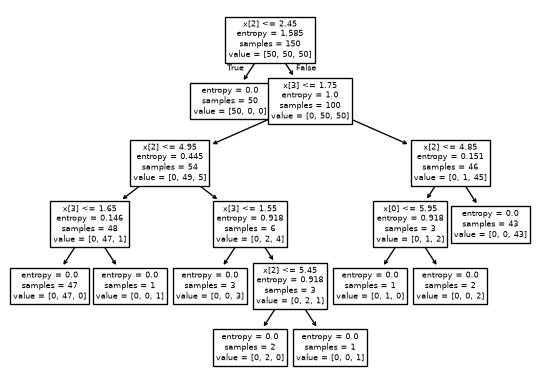

In [27]:
import matplotlib.pyplot as plt

tree.plot_tree(clf)
plt.show()

## Example: Visualizing the tree (2/2)

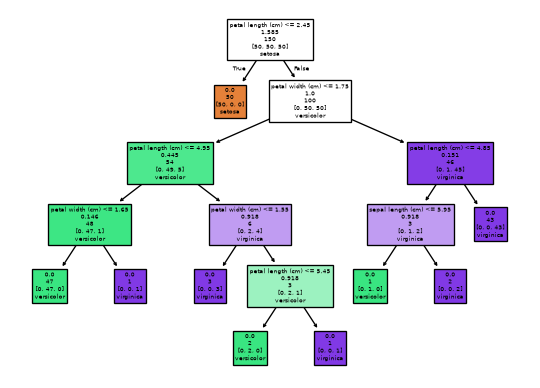

In [28]:
tree.plot_tree(clf, 
               feature_names=iris.feature_names, 
               class_names=iris.target_names,
               label='none',
               filled=True)
plt.show()

In a
[`DecisionTreeClassifier`](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html),
each internal node of the tree represents a decision based on a feature,
each branch represents the outcome of that decision, and each leaf node
represents a class label. The decision tree makes predictions by
traversing from the root to a leaf node, following the decision rules
defined at each node. Decision trees are intuitive and easy to interpret
but can be prone to overfitting if not properly regulated.

To build a decision tree, the method `fit` follows these steps:

1.  **Evaluate Candidate Splits**: For each numerical feature, consider
    thresholds between observed values.
2.  **Select the Best Split**: Retain the feature and threshold that
    produce the lowest weighted [entropy](../../glossary/entropy.qmd).
3.  **Split the Dataset**: Send examples to the left or right child
    according to the selected threshold.
4.  **Repeat Recursively**: Apply the same process within each child. A
    numerical feature may be used again farther down the tree.
5.  **Stop Conditions**: Stop the recursion when one of the following
    conditions is met:
    - All instances in a subset belong to the same class.
    - No candidate split improves the objective.
    - A predefined depth limit or minimum number of instances per node
      is reached.
6.  **Assign Labels**: For each leaf node, assign a class label based on
    the majority class of instances in that subset.

This process results in a tree where each path from the root to a leaf
represents a classification rule.

In the figure above, the decision nodes contain the following
information. - The decision rule, e.g. `petal width (cm) <= 0.8` - The
entropy of the node. - The number of examples in the subset
corresponding to this node of the tree. - The number of examples for
each of the classes, in the subset corresponding to this node of the
tree. - A prediction.

Decision trees are constructed by incrementally adding decision nodes,
guided by labelled training examples. A useful split need not separate
every class perfectly; it should reduce the weighted entropy of the
resulting children. For instance, `petal width (cm) <= 0.8` separates
Setosa from the other two species in this dataset. When the condition
holds (left child), all examples are Setosa. The right child contains
Versicolor and Virginica, but no Setosa.

**See**: - Kingsford and Salzberg (2008), [you can access the paper
here, html or PDF, from a computer with a uOttawa IP
address](https://doi.org/10.1038/nbt0908-1011).

## Example: Prediction

In [29]:
# Create two new examples
# 'sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)'

new_irises = [[5.1, 3.5, 1.4, 0.2], [6.7, 3.0, 5.2, 2.3]]

# Prediction

predictions = clf.predict(new_irises)

# Printing the predicted labels for our two examples

print(iris.target_names[predictions])

['setosa' 'virginica']

## Example: Complete

['setosa' 'virginica']

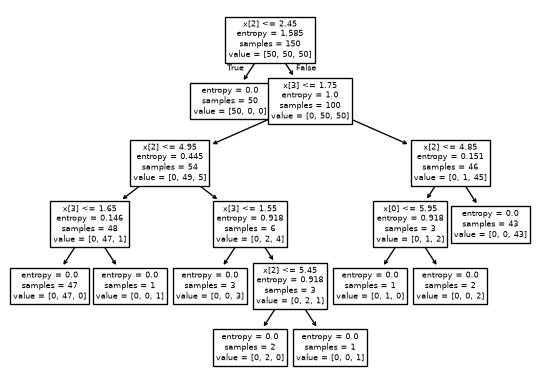

In [30]:
iris = load_iris()
clf = tree.DecisionTreeClassifier(criterion="entropy", random_state=42)
X, y = iris.data, iris.target
clf = clf.fit(X, y)
tree.plot_tree(clf)
new_irises = [[5.1, 3.5, 1.4, 0.2], [6.7, 3.0, 5.2, 2.3]]
predictions = clf.predict(new_irises)
print(iris.target_names[predictions])

## Example: Performance

In [31]:
from sklearn.metrics import classification_report, accuracy_score

# Make predictions

y_pred = clf.predict(X)

# Evaluate the model

accuracy = accuracy_score(y, y_pred)
report = classification_report(y, y_pred, target_names=iris.target_names)

print(f'Accuracy: {accuracy:.2f}')
print('Classification Report:')
print(report)

Accuracy: 1.00
Classification Report:
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        50
  versicolor       1.00      1.00      1.00        50
   virginica       1.00      1.00      1.00        50

    accuracy                           1.00       150
   macro avg       1.00      1.00      1.00       150
weighted avg       1.00      1.00      1.00       150


The performance of this classifier appears to be perfect at first
glance. However, is it really?

## Example: Discussion

We have demonstrated a complete example:

- Loading the data
- Selecting a classifier
- Training the model
- Visualizing the model
- Making a prediction

However, several simplifications were made throughout this process.

## Example: Take 2

In [32]:
from sklearn.metrics import classification_report, accuracy_score

# Make predictions

y_pred = clf.predict(X)

# Evaluate the model

accuracy = accuracy_score(y, y_pred)
report = classification_report(y, y_pred, target_names=iris.target_names)

print(f'Accuracy: {accuracy:.2f}')
print('Classification Report:')
print(report)

> **Important**
>
> This example is misleading, or even flawed!

The performance of this classifier appears to be perfect at first
glance. However, is it really?

## Example: Exploration

In [33]:
print(f'Dataset Description:\n{iris["DESCR"]}\n')

Dataset Description:
.. _iris_dataset:

Iris plants dataset
--------------------

**Data Set Characteristics:**

:Number of Instances: 150 (50 in each of three classes)
:Number of Attributes: 4 numeric, predictive attributes and the class
:Attribute Information:
    - sepal length in cm
    - sepal width in cm
    - petal length in cm
    - petal width in cm
    - class:
            - Iris-Setosa
            - Iris-Versicolour
            - Iris-Virginica

:Summary Statistics:

============== ==== ==== ======= ===== ====================
                Min  Max   Mean    SD   Class Correlation
============== ==== ==== ======= ===== ====================
sepal length:   4.3  7.9   5.84   0.83    0.7826
sepal width:    2.0  4.4   3.05   0.43   -0.4194
petal length:   1.0  6.9   3.76   1.76    0.9490  (high!)
petal width:    0.1  2.5   1.20   0.76    0.9565  (high!)
============== ==== ==== ======= ===== ====================

:Missing Attribute Values: None
:Class Distribution: 33.3% for e

## Example: Exploration

In [34]:
print(f'Feature Names: {iris.feature_names}')

Feature Names: ['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)']

In [35]:
print(f'Target Names: {iris.target_names}')

Target Names: ['setosa' 'versicolor' 'virginica']

In [36]:
print(f'Data Shape: {iris.data.shape}')

Data Shape: (150, 4)

In [37]:
print(f'Target Shape: {iris.target.shape}')

Target Shape: (150,)

## Example: Using `Pandas` (continued)

In [38]:
import pandas as pd

# Create a DataFrame

df = pd.DataFrame(iris.data, columns=iris.feature_names)
df['species'] = iris.target_names[iris.target]

## Example: Using `Pandas` (continued)

In [39]:
# Display the first few rows of the DataFrame

print(df.head())

   sepal length (cm)  sepal width (cm)  petal length (cm)  petal width (cm)  \
0                5.1               3.5                1.4               0.2   
1                4.9               3.0                1.4               0.2   
2                4.7               3.2                1.3               0.2   
3                4.6               3.1                1.5               0.2   
4                5.0               3.6                1.4               0.2   

  species  
0  setosa  
1  setosa  
2  setosa  
3  setosa  
4  setosa  

## Example: Using `Pandas` (continued)

In [40]:
# Summary statistics

print(df.describe())

       sepal length (cm)  sepal width (cm)  petal length (cm)  \
count         150.000000        150.000000         150.000000   
mean            5.843333          3.057333           3.758000   
std             0.828066          0.435866           1.765298   
min             4.300000          2.000000           1.000000   
25%             5.100000          2.800000           1.600000   
50%             5.800000          3.000000           4.350000   
75%             6.400000          3.300000           5.100000   
max             7.900000          4.400000           6.900000   

       petal width (cm)  
count        150.000000  
mean           1.199333  
std            0.762238  
min            0.100000  
25%            0.300000  
50%            1.300000  
75%            1.800000  
max            2.500000  

## Example: Using `Seaborn`

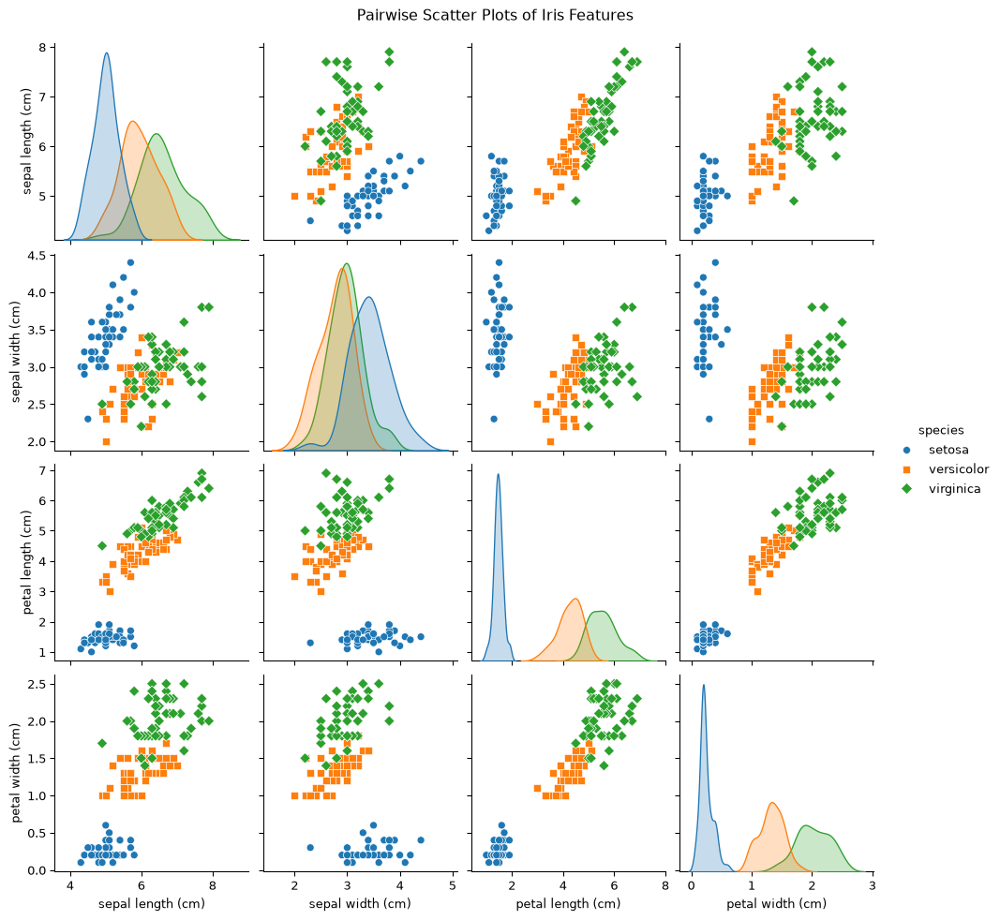

In [41]:
import seaborn as sns

# Pairplot using seaborn

sns.pairplot(df, hue='species', markers=["o", "s", "D"])
plt.suptitle("Pairwise Scatter Plots of Iris Features", y=1.02)
plt.show()

What insights can be drawn from examining the graphs?

The figure presents pairwise plots of the Iris features, with the
diagonal showing the distribution of each individual feature. Each dot
represents an example ($x$), and the colours indicate its label ($y$).

Let’s first consider the diagonal elements:

- Is it possible to classify the examples using a single feature?
- We observe that **sepal** **length** or **width** alone cannot
  distinguish between the classes.
- However, **petal length** and **petal width** allow us to distinguish
  **setosa** from the other two species, although they do not separate
  **versicolor** and **virginica** perfectly.

The class **setosa** frequently forms a distinct cluster.

## Example: Training and Test Set

In [42]:
from sklearn.model_selection import train_test_split

# Split the dataset into training and testing sets

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=7,
    stratify=y,
)

Our initial decision tree was constructed and evaluated using the entire
dataset. It can fit those examples closely, but this does not tell us
how accurately it will predict **unseen data**.

We will have a lot more to say about testing in the coming weeks.

For narrative clarity, this appendix explores the full dataset before
introducing the split. In a rigorous experiment, the test set should be
set aside before making data-driven modelling choices and left untouched
until final evaluation.

`random_state` makes the pseudo-random partition reproducible. Changing
it changes which examples are held out and may change the measured
accuracy. `stratify=y` keeps the class proportions approximately
consistent across the two subsets.

**Practice:** Experiment with different values for `random_state`. What
do you observe, and why?

## Example: Creating a New Classifier

In [43]:
clf = tree.DecisionTreeClassifier(criterion="entropy", random_state=42)

## Example: Training the New Classifier

In [44]:
# Train the model
clf.fit(X_train, y_train)

## Example: Making Predictions

In [45]:
# Make predictions
y_pred = clf.predict(X_test)

## Example: Measuring the Performance

In [46]:
from sklearn.metrics import classification_report, accuracy_score
# Make predictions

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(
    y_test,
    y_pred,
    labels=clf.classes_,
    target_names=iris.target_names[clf.classes_],
)

print(f'Accuracy: {accuracy:.2f}')
print('Classification Report:')
print(report)

Accuracy: 0.93
Classification Report:
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        10
  versicolor       0.90      0.90      0.90        10
   virginica       0.90      0.90      0.90        10

    accuracy                           0.93        30
   macro avg       0.93      0.93      0.93        30
weighted avg       0.93      0.93      0.93        30


Here is a discussion on [model
persistence](https://scikit-learn.org/stable/model_persistence.html) for
scikit-learn models.

------------------------------------------------------------------------

Marcel **Turcotte**

<Marcel.Turcotte@uOttawa.ca>

School of Electrical Engineering and **Computer Science** (EE**CS**)

University of Ottawa